# Detecting Cancer in Gigapixel Medical Images

## Final Project for Applied Deep Learning (Fall 2018) by Aleksandra 'Ola' Hosa

### YouTube [demo](https://youtu.be/OL3j-ZDUQB8). GitHub [repo](https://github.com/olahosa/adl_cancer_detection).

* Source of medical slides and tumor masks: [CAMELYON16](https://camelyon17.grand-challenge.org/Data/) dataset. 

* You can find a folder of 22 slides and tumor masks prepared by Joshua Gordon [here](https://drive.google.com/drive/folders/1rwWL8zU9v0M27BtQKI52bF6bVLW82RL5?usp=sharing).

* To run this code, first you will need to install [OpenSlide](https://openslide.org/), the only non-Python dependency (can be installed in Colab)

### Intro

In this project I follow the methodology of [Lui et al. (2017)](https://arxiv.org/abs/1703.02442) in "Detecting Cancer Metastases on Gigapixel Pathology Images". I train a neural network with a convolutional base on patches extracted from the medical slides. The classifier is then used on unseen images to detect the presence of tumors and produce heatmaps. This notebook contains a verions of the model with a **single** zoom level input. This implementation allows for a choice of:
- magnification (zoom) level for the model: an integer between 0 and 7 (athough greater than 4 not recommended)
- sizes of the patch and of the centre of the model
- pre-processing method (rescaling to [0, 1] or to [-1, 1])
- type of convolutional base: Inception or a base defined by me (takes less time to train)


### Notebook Overview

1. Set-up: choose model configuration (zoom level etc.)
2. Install and import necessary packages
3. Mount Google Drive (user intervention necessary)
4. Download slides files from Google Drive
5. Collect train/val and test patches
6. Post-process extracted patches
7. Model definition
8. Model execution
9. Model evaluation
10. Heatmap generation



### Practical considerations
- copy only a subset (11) or all slides provided by Joshua Gordon (22) becasue of storage memory constraints on Colab
- due to RAM constraints on Colab I was able to run only single zoom level model in Colab (multiple zoom level model version for Google Cloud compute)
- the number of patches in the training and test set is also dictated by the RAM constraints - greater number will crash Colab
- delete all variables once they become unnecessary to save RAM
- the highest resultion level image I was able to read in Colab without crashing RAM was level 4 - that's the reason I use it to determine if a patch has enough tissue pixels in Patch Extraction
- I save all my outputs (data, models, pdfs) to Colab and immediately transfer them to my Google Drive to avoid losing anything (Colab sometimes restarts unexpectedly and removes all saved files)

The notebook is running end-to-end in Colab, with the exception of mounting the Google Drive folder, where I keep the slides (copeid from Joshua Gordon's Google Drive).

# Set-up











In [0]:
# remove any outputs from the previus runs
!rm *.pdf *.npy *.h5

In [2]:
# set level: 0 to 7 (greater than 4 not recommended)
lev = 4

# set patch sizes (I don't recomment changing that, although making it smaller 
# will decrease run time)
patch_size = 299
patch_centre = 128

# choose pre-processing: 'rescale_0-1' or 'rescale_-1-1'
my_pre_process = 'rescale_0-1'

# choose conv base: 'Inception' or 'my-conv-base'
my_conv_base = 'my-conv-base'

model_name = 'single-input_' + my_conv_base + '_' + my_pre_process + '_lev' + str(lev)
print(model_name)

single-input_my-conv-base_rescale_0-1_lev4


# Install and import packages

In [3]:
# Install the OpenSlide C library and Python bindings
!apt-get install openslide-tools
!pip install openslide-python

# Install the PyDrive wrapper 
!pip install -U -q PyDrive

Reading package lists... Done
Building dependency tree       
Reading state information... Done
openslide-tools is already the newest version (3.4.1+dfsg-2).
0 upgraded, 0 newly installed, 0 to remove and 8 not upgraded.


In [4]:
from openslide import open_slide, __library_version__ as openslide_lib_version, __version__ as openslide_version

import numpy as np
import random, os, glob, time

import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib.colors import Normalize

from PIL import Image

import tensorflow as tf
from tensorflow.keras.models import load_model
from keras.preprocessing.image import array_to_img

from skimage.color import rgb2gray
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, average_precision_score, f1_score, recall_score, precision_score

# PyDrive wrapper libraries.
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

Using TensorFlow backend.


In [5]:
print('openslide version:', openslide_version)
print('openslide library version:', openslide_lib_version)
!python --version

openslide version: 1.1.1
openslide library version: 3.4.1
Python 3.6.7


# Mount Google Drive

In [0]:
# Authenticate and create the PyDrive client.
# This only needs to be done once in a notebook.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

# Download data from Google Drive

## Download slides

In [0]:
# only download the slides if they are not already on Colab (need to do this
# every ~12h when Colab restarts and removes everything in your folder)
if len(glob.glob('/root/slides/'))==0:

  # choose a local (Colab) directory to store the data.
  local_download_path = os.path.expanduser('~/slides')
  try:
    os.makedirs(local_download_path)
  except: pass

  !ls -hlt

  # auto-iterate using the query syntax
  # https://developers.google.com/drive/v2/web/search-parameters
  # put the id of the folder in your Google Drive here
  file_list = drive.ListFile(
      {'q': "'1rwWL8zU9v0M27BtQKI52bF6bVLW82RL5' in parents and trashed=false"}).GetList()

  # only download a subset of files because of lack of space on Colab - 
  # chose the ones with the most cancer
  to_download = ['016', '031', '064', '075', '078', '084', '091', '094', '096', '101', '110']

  for f_num in to_download:
    for f in file_list:
      print(f)
      # create & download by id
      if f_num in f['title']:
        print('title: %s, id: %s' % (f['title'], f['id']))
        fname = os.path.join(local_download_path, f['title'])
        print('downloading to {}'.format(fname))
        f_ = drive.CreateFile({'id': f['id']})
        f_.GetContentFile(fname)

In [8]:
# check that the slides are there
!ls -hlt /root/slides/

total 15G
-rw-r--r-- 1 root root 664K Dec 19 18:22 tumor_110.xml
-rw-r--r-- 1 root root  32M Dec 19 18:22 tumor_110_mask.tif
-rw-r--r-- 1 root root 1.4G Dec 19 18:22 tumor_110.tif
-rw-r--r-- 1 root root 172K Dec 19 18:21 tumor_101.xml
-rw-r--r-- 1 root root  44M Dec 19 18:21 tumor_101_mask.tif
-rw-r--r-- 1 root root 1.4G Dec 19 18:21 tumor_101.tif
-rw-r--r-- 1 root root 255K Dec 19 18:21 tumor_096.xml
-rw-r--r-- 1 root root  42M Dec 19 18:21 tumor_096_mask.tif
-rw-r--r-- 1 root root 1.3G Dec 19 18:21 tumor_096.tif
-rw-r--r-- 1 root root  26K Dec 19 18:21 tumor_094.xml
-rw-r--r-- 1 root root  52M Dec 19 18:21 tumor_094_mask.tif
-rw-r--r-- 1 root root 1.5G Dec 19 18:21 tumor_094.tif
-rw-r--r-- 1 root root  15M Dec 19 18:20 tumor_091_mask.tif
-rw-r--r-- 1 root root 522M Dec 19 18:20 tumor_091.tif
-rw-r--r-- 1 root root  77K Dec 19 18:20 tumor_091.xml
-rw-r--r-- 1 root root 113K Dec 19 18:20 tumor_084.xml
-rw-r--r-- 1 root root  25M Dec 19 18:20 tumor_084_mask.tif
-rw-r--r-- 1 root root 80

## Download training and test data

I saves the training and test data after extracting patches so I wouldn't have to re-run patch extraction for models with teh same zoom level but different convolutional base or pre-processing method.

Comment this out if running for the first time.

In [0]:
# # choose a local (Colab) directory to store the data
# local_download_path = os.path.expanduser('.')
# try:
#   os.makedirs(local_download_path)
# except: pass

# # auto-iterate using the query syntax
# # https://developers.google.com/drive/v2/web/search-parameters
# # put the id of the folder in your Google Drive here
# google_id_dict = {0: '1kWx922TKmAt2mL_GX4QiXrKYFROzXiRa',
#                   1: '1On3pgsSIoQBGXFZ29p2tpzVsqeT24UyJ',
#                   2: '1FaTme1rN5HZFPYQEUXz6NPuNPOvgiy2y',
#                   3: '1Mc6eKLw9CcCA4eggJxFcIMv-1sgClAMs',
#                   4: '1_Q5SoSCfSX-EGUzJFJp9o6igUzIpRQKi'}

# file_list = drive.ListFile(
#     {'q': "'" + google_id_dict[lev] + "' in parents and trashed=false"}).GetList()

# for f in file_list:
#   print(f)
#   # create & download by id
#   if '.npy' in f['title']:
#     print('title: %s, id: %s' % (f['title'], f['id']))
#     fname = os.path.join(local_download_path, f['title'])
#     print('downloading to {}'.format(fname))
#     f_ = drive.CreateFile({'id': f['id']})
#     f_.GetContentFile(fname)

# # check that the data files are there
# !ls -hlt *.npy

# Collect train/val and test patches

In [0]:
# functions provided by Joshua Gordon

# See https://openslide.org/api/python/#openslide.OpenSlide.read_region
# Note: x,y coords are with respect to level 0.

def read_slide(slide, x, y, level, width, height, as_float=False):
    """ Read a region from the slide
    Return a numpy RBG array
    """
    
    im = slide.read_region((x,y), level, (width, height))
    im = im.convert('RGB') # drop the alpha channel
    if as_float:
        im = np.asarray(im, dtype=np.float32)
    else:
        im = np.asarray(im)
    assert im.shape == (height, width, 3)
    return im

def find_tissue_pixels(image, intensity=0.8):
    """ Return tissue pixels for an image
    """
    
    im_gray = rgb2gray(image)
    assert im_gray.shape == (image.shape[0], image.shape[1])
    indices = np.where(im_gray <= intensity)
    return zip(indices[0], indices[1])
  
def apply_mask(im, mask, color=(1,0,0)):
    """ Return the mask as an image
    """
    
    masked = np.zeros(im.shape)
    for x,y in mask: masked[x][y] = color
    return masked

In [0]:
def plot_patch_triplet(lev, patch_centre, patch_image, patch_mask, patch_tissue, figname, f_num):
    """ Plot a triplet of images for an extracted patch:
    a) RBG image of patch
    b) RBG image with tumor mask overlay and 128x128 center red square
    c) tissue mask with tumor mask overlay
    inputs:
    - lev: int, between 0 and 7
    - patch_centre: int, usually 128
    - patch_image: image of a patch
    - patch_mask: mask of tumor for that patch
    - patch_tissue: image of 
    - figname: str, file name for the figure
    - f_num: str, slide number
    outputs: none, figure plotted and saved
    """
    
    # get patch size
    patch_size = patch_image.shape[0]
    # get the offset for plotting the 128x128 red square
    offset = int((patch_size-patch_centre)/2)
    
    # calc tissue ratio in the patch to display in figure title
    tissue_ratio = np.sum(patch_tissue[:,:,0])/(patch_size**2)
    
    fig, axes = plt.subplots(1,3, figsize=(15,5))
    
    cmap = plt.cm.viridis

    # normalize the patch mack between 0 and 1
    v_min, v_max = 0, 1
    colors = Normalize(v_min, v_max)(patch_mask)
    colors = cmap(colors)
    # add transparency layer equal to the image: low values are translarent,
    # high values are more opaque
    colors[..., -1] = patch_mask
    
    # image a) patch in RGB
    a = axes[0]
    a.imshow(patch_image)
    a.set_title('Slide %s, level: %d' % (f_num, lev))
    a.grid(False)

    # image b) patch with tumor overlay (viridis) - cancer is yellow
    a = axes[1]
    a.imshow(patch_image)
    a.grid(False)
    a.imshow(colors, cmap='viridis', vmin=v_min, vmax=v_max, alpha=0.8)
    a.plot([offset, offset+patch_centre, offset+patch_centre, offset, offset],
                 [offset, offset, offset+patch_centre, offset+patch_centre, offset], 'r')
    a.set_title('Cancer is yellow: if in red square - label 1')

    # image c) tissue mask with tumor mask overlay
    a = axes[2]
    a.imshow(patch_tissue, cmap='plasma', vmin=0, vmax=1), axes[2].grid(False)
    a.imshow(colors, cmap='viridis', vmin=v_min, vmax=v_max, alpha=0.5)
    a.set_title('Tissue ratio: ' + str(round(tissue_ratio,2)))
    
    plt.show()
    fig.savefig(figname+'.pdf', bbox_inches='tight')

In [0]:
def get_patches(slide, tumor_mask, lev, x0, y0, patch_size):
    """ Get patches from a slide: RBG image, tumor mask, tissue mask CENTERED at x0, y0
    imputs:
    - slide: OpenSlide object for RGB slide images
    - tumor_mask: OpenSlide object for tumor masks
    - lev: int, target zoom level for the patches, between 0 and 7
    - x0, y0: int, pixel coordinates at level 0
    - patch_size: int, usually 299
    outputs:
    - patch_image: array, RBG image
    - patch_mask: array, tumor mask
    - patch_tissue: array, tissue mask
    """
        
    # calc downsample factor
    downsample_factor = 2**lev
    
    # read RGB patch
    patch_image = read_slide(slide,
                             x = x0-(patch_size//2)*downsample_factor,
                             y = y0-(patch_size//2)*downsample_factor, 
                             level = lev,
                             width = patch_size,
                             height = patch_size)
    
    # read tumor mask
    patch_mask = read_slide(tumor_mask,
                            x = x0-(patch_size//2)*downsample_factor,
                            y = y0-(patch_size//2)*downsample_factor, 
                            level = lev,
                            width = patch_size,
                            height = patch_size)
    
    # 1 channel is enough for the mask
    patch_mask = patch_mask[:,:,0]
    
    # make tissue mask
    tissue_pixels = find_tissue_pixels(patch_image)
    patch_tissue = apply_mask(patch_image, tissue_pixels)
    
    return patch_image, patch_mask, patch_tissue

In [0]:
def check_patch_centre(patch_mask, patch_centre):
    """ Check if there is any tumor pixel in the 128x128 centre
    inputs:
    - patch_mask: array, tumor mask
    - patch_centre: int, usually 128
    outputs: Boolean
    """
    
    # get patch size
    patch_size = patch_mask.shape[0]
    
    # get the offset to check the 128x128 centre
    offset = int((patch_size-patch_centre)/2)
    
    # sum the pixels in the 128x128 centre for the tumor mask
    sum_cancers = np.sum(patch_mask[offset:offset+patch_centre, offset:offset+patch_centre])
    
    return sum_cancers>0

In [0]:
def collect_patches(img_list, lev, num_per_img, patch_size, patch_centre):
  """ Extract patches with labels from the slides in the list
  inputs:
  - img_list: list of str, slide numbers to process
  - lev: int, target zoom level for the patches, between 0 and 7
  - num_per_imgm: int, number of patches to extract per slide per class, usually 100
  - patch_size: int, usually 299
  - patch_centre: int, usually 128
  outputs:
  - patch_images: list, extracted patches as arrays
  - patch_labels: list, labels of patches: 0 - healthy, 1 - tumor
  - save a plot of the patches
  """

  # init output lists
  patch_images = []
  patch_labels = []

  for i, f_num in enumerate(img_list):

      num_cancer = 0
      num_health = 0

      # file paths
      slide_path = '/root/slides/tumor_'+f_num+'.tif'
      tumor_mask_path = '/root/slides/tumor_'+f_num+'_mask.tif'

      # get images with OpenSlide
      slide = open_slide(slide_path)
      tumor_mask = open_slide(tumor_mask_path)

      # read level 4 slide image and mask - for the purposes of getting healthy
      # and tumor pixels
      # (this is the highest resolution level that can be read in Colab)
      slide_image = read_slide(slide, 
                           x=0, 
                           y=0, 
                           level=4, 
                           width=slide.level_dimensions[4][0], 
                           height=slide.level_dimensions[4][1])

      mask_image = read_slide(tumor_mask, 
                          x=0, 
                          y=0, 
                          level=4, 
                          width=slide.level_dimensions[4][0], 
                          height=slide.level_dimensions[4][1])

      mask_image = mask_image[:,:,0]

      # get a list of tumor pixels at level 4
      mask_lev_4_cancer = np.nonzero(mask_image)
      
      # make a healthy tissue mask by subtracting tumor mask from tissue mask
      tissue_pixels = find_tissue_pixels(slide_image)
      tissue_regions = apply_mask(slide_image, tissue_pixels)

      mask_health = tissue_regions[:,:,0]-mask_image
      mask_health = mask_health>0
      mask_health = mask_health.astype('int')

      # get a list of healthy pixels at level 4
      mask_lev_4_health = np.nonzero(mask_health)

      print()
      print(f_num, len(mask_lev_4_cancer[0])//(patch_size**2), len(mask_lev_4_health[0])//(patch_size**2))
      
      # -------------------------------------------------------------
      # extract TUMOR patches

      # get a random sample of tumor pixels 
      # Note: did random.sample here rather than random.choice inside the while loop because os speed
      sample_cancer = random.sample(list(zip(mask_lev_4_cancer[1], mask_lev_4_cancer[0])), 500)
      
      c = 0
      
      # continue until enough patches extracted
      while num_cancer<num_per_img:
          c += 1
          if c%10==0:
              print(c, end=', ')

          # get the next pixel from the sample - coordinates at level 4
          (x4, y4) = sample_cancer[c]

          # convert level 4 coordinates to level 0
          x0 = x4*(2**4)
          y0 = y4*(2**4)

          # extract patches CENTERED at that pixel
          patch_image, patch_mask, patch_tissue = get_patches(slide, tumor_mask, lev, x0, y0, patch_size)

          # calc tissue ratio in that patch
          tissue_ratio = np.sum(patch_tissue[:,:,0])/(patch_size**2)

          # double-check if the patch has tumor
          has_cancer = check_patch_centre(patch_mask, patch_centre)

          # if it has more than 50% tissue and has tumor
          if (tissue_ratio>0.5) & has_cancer:

              # collect it
              num_cancer += 1
              patch_images.append(patch_image)
              patch_labels.append(1)

              # plot the last one
              if len(patch_labels)%num_per_img==0:
                  figname = model_name+'_patches_'+f_num+'_cancer-'+str(has_cancer)
                  plot_patch_triplet(lev, patch_centre, patch_image, patch_mask, patch_tissue, figname, f_num)
                  
                  
      # -------------------------------------------------------------
      # extract HEALTHY patches
      # repeat the above for the healthy pixels

      print()
      # get a random sample of healthy pixels 
      sample_health = random.sample(list(zip(mask_lev_4_health[1], mask_lev_4_health[0])), 1000)
      
      c = 0

      while num_health<num_per_img:
          c += 1
          if c%10==0:
              print(c, end=', ')

          # get the next pixel from the sample - coordinates at level 4
          (x4, y4) = sample_health[c]

          # convert level 4 coordinates to level 0
          x0 = x4*(2**4)
          y0 = y4*(2**4)

          # extract patches CENTERED at that pixel
          patch_image, patch_mask, patch_tissue = get_patches(slide, tumor_mask, lev, x0, y0, patch_size)

          # calc tissue ratio in that patch
          tissue_ratio = np.sum(patch_tissue[:,:,0])/(patch_size**2)

          # check if the patch has tumor
          has_cancer = check_patch_centre(patch_mask, patch_centre)

          # if it has more than 50% tissue and doens't have tumor in the 128x128 centre
          if (tissue_ratio>0.5) & (not has_cancer):

              # collect it
              num_health += 1
              patch_images.append(patch_image)
              patch_labels.append(0)

              # plot the last one
              if len(patch_labels)%num_per_img==0:
                  figname = model_name+'_patches_'+f_num+'_cancer-'+str(has_cancer)
                  plot_patch_triplet(lev, patch_centre, patch_image, patch_mask, patch_tissue, figname, f_num)
                  
           
  return patch_images, patch_labels


016 7 40
10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 

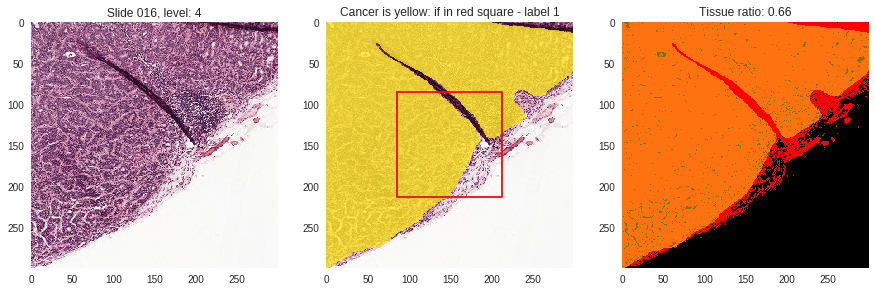


10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 

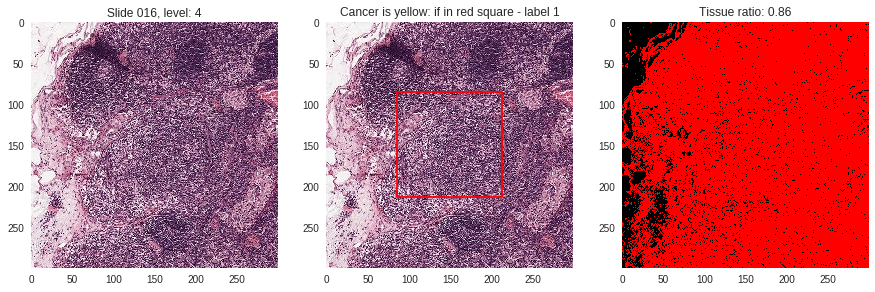


031 5 26
10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 

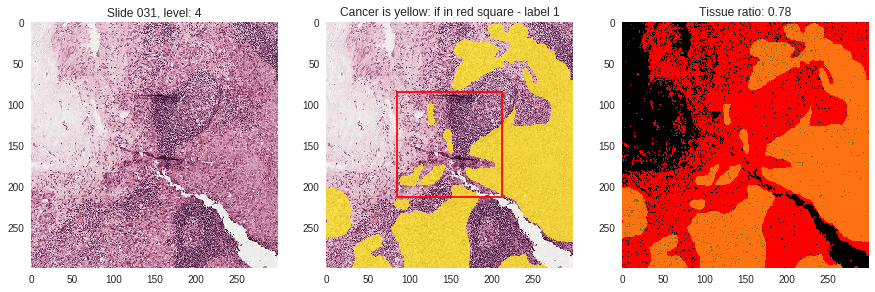


10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200, 210, 220, 230, 240, 250, 260, 270, 280, 290, 

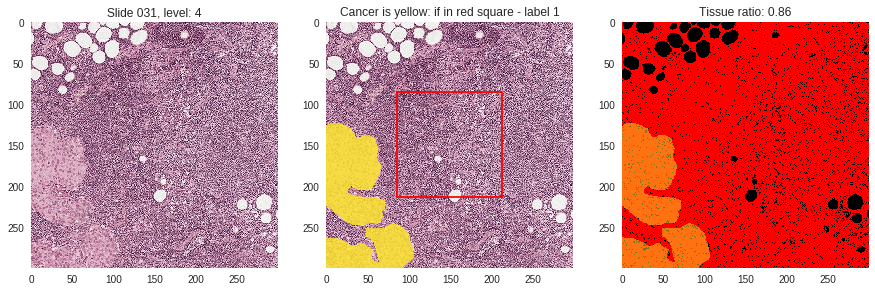


064 5 35
10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 

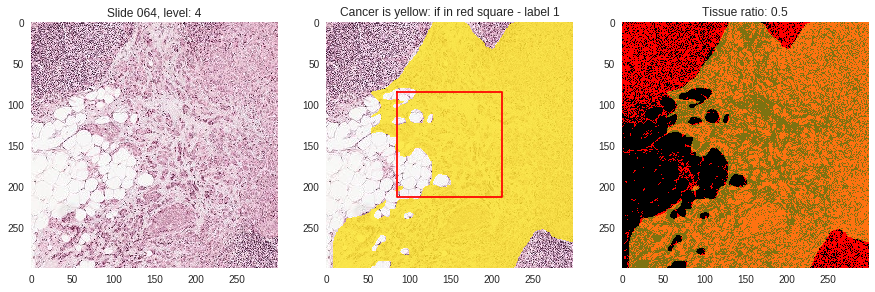


10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200, 210, 220, 230, 240, 250, 260, 270, 

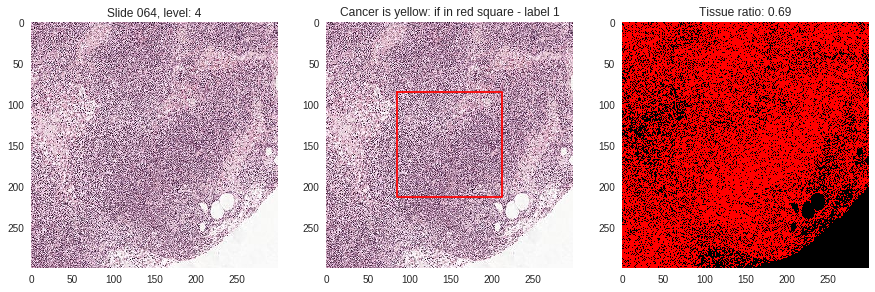


075 2 39
10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 

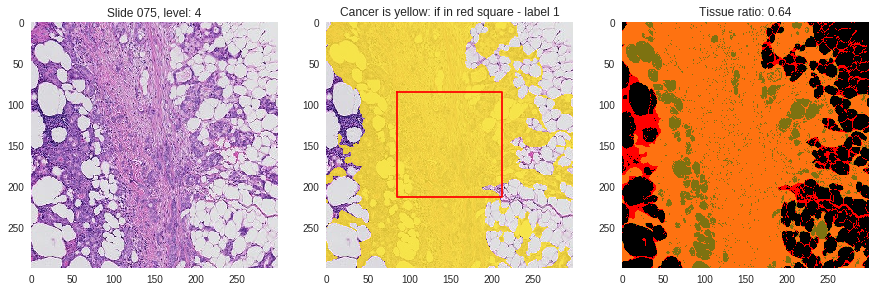


10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180, 

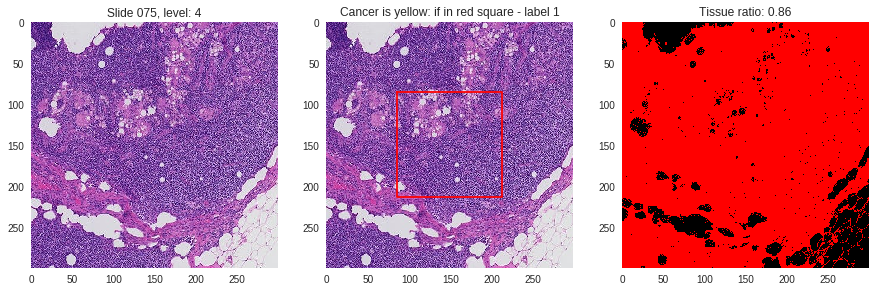


078 42 101
10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 

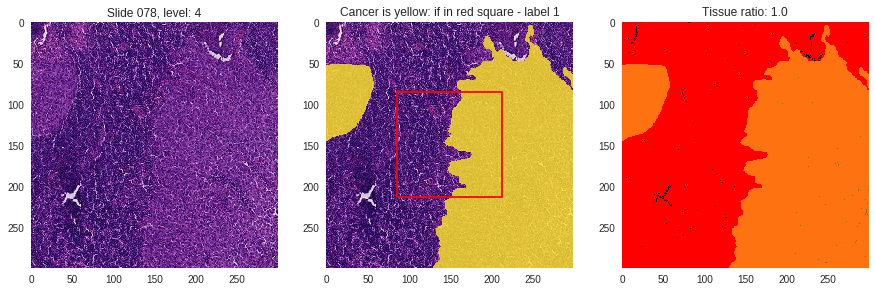


10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 

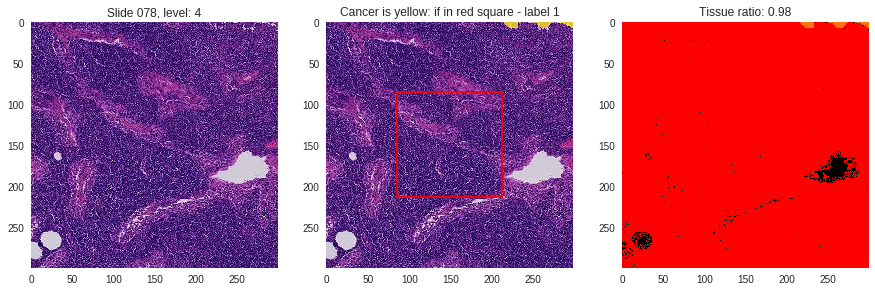


084 1 50
10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 

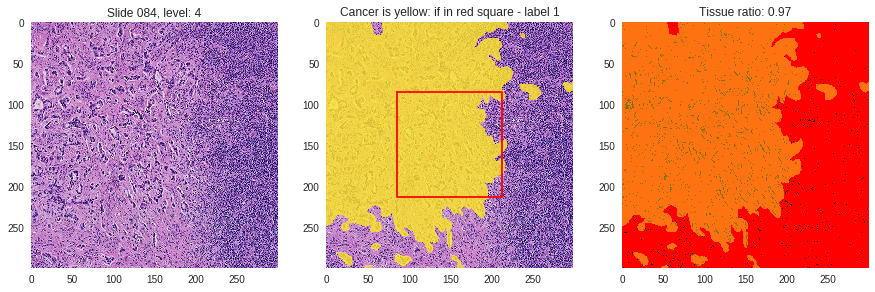


10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 

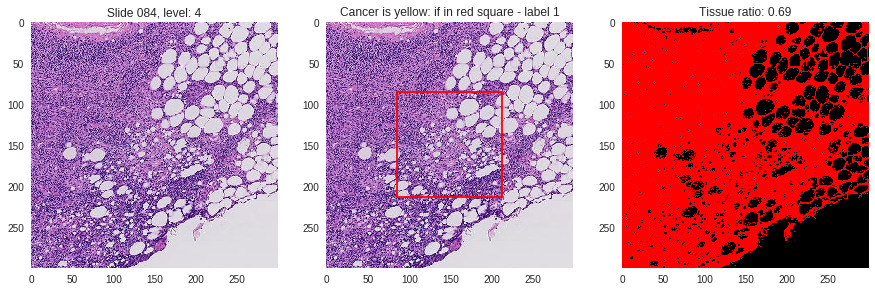


094 2 89
10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 

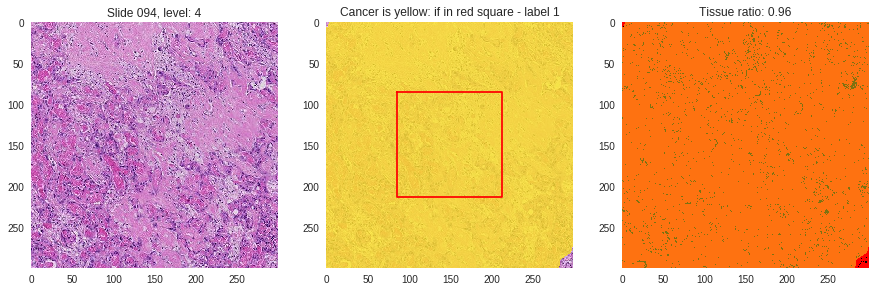


10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 

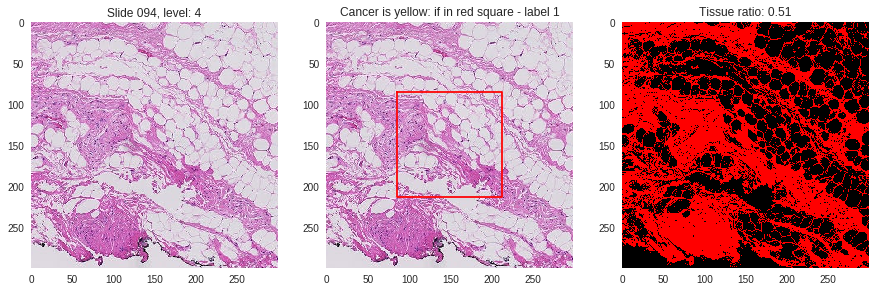


096 1 72
10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 

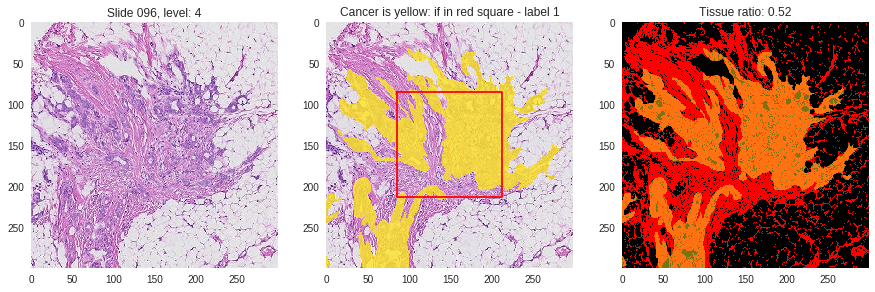


10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 

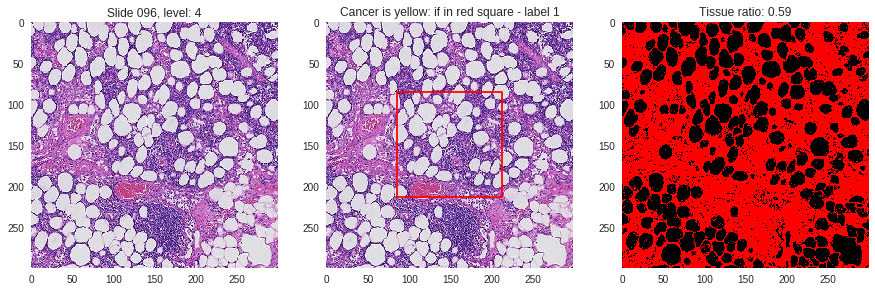


101 8 89
10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 

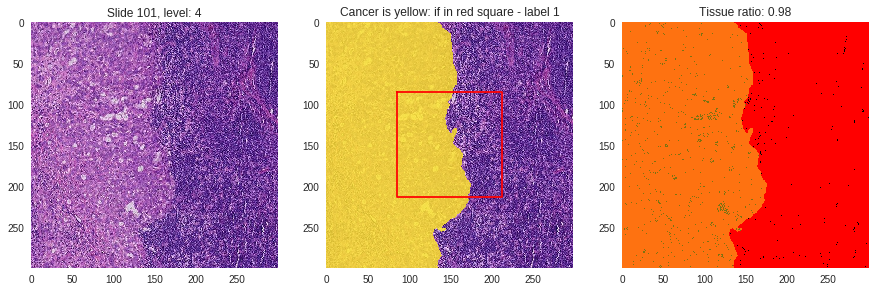


10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 

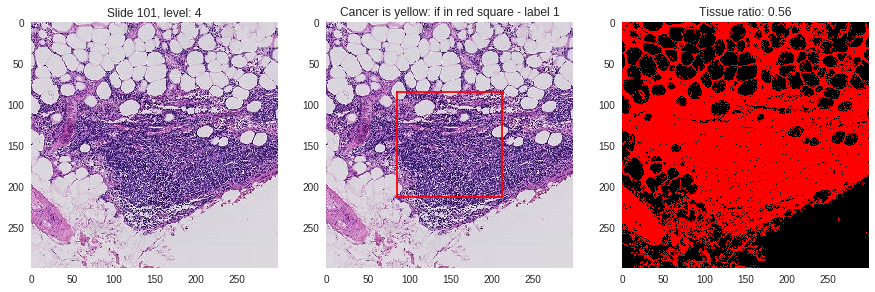


091 2 36
10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 

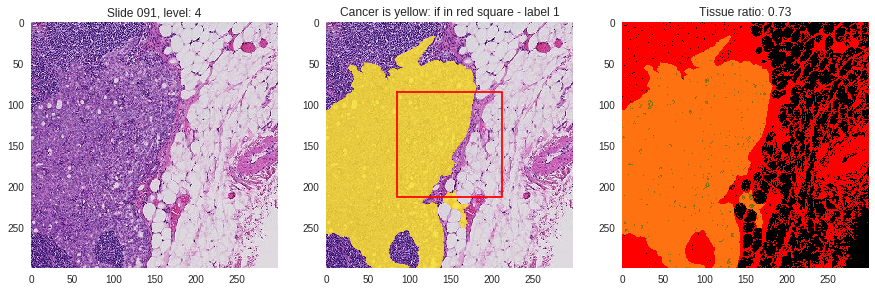


10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 

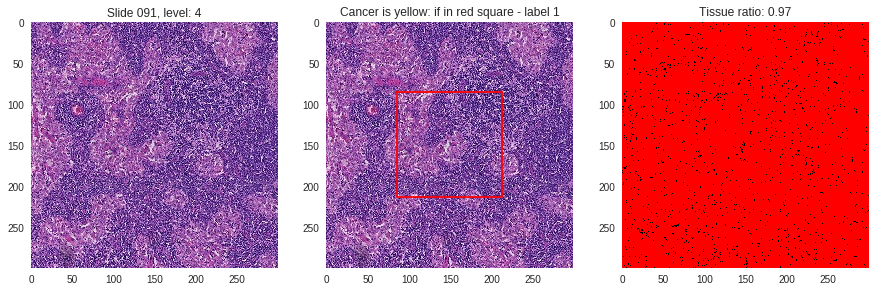

In [15]:
# define a list of images in the training and the test sets

trainval_img_list = ['016', '031', '064', '075', '078', '084', '094', '096', '101']
test_img_list = ['091']

# run patch extraction for training and test

trainval_patch_images, trainval_patch_labels = collect_patches(trainval_img_list, lev, 100, patch_size, patch_centre)
test_patch_images, test_patch_labels = collect_patches(test_img_list, lev, 100, patch_size, patch_centre)

In [16]:
# check saved pdf files with patch triplets
!ls -hlt *.pdf

-rw-r--r-- 1 root root 370K Dec 19 20:36 single-input_my-conv-base_rescale_0-1_lev4_patches_091_cancer-False.pdf
-rw-r--r-- 1 root root 337K Dec 19 20:36 single-input_my-conv-base_rescale_0-1_lev4_patches_091_cancer-True.pdf
-rw-r--r-- 1 root root 323K Dec 19 20:36 single-input_my-conv-base_rescale_0-1_lev4_patches_101_cancer-False.pdf
-rw-r--r-- 1 root root 351K Dec 19 20:35 single-input_my-conv-base_rescale_0-1_lev4_patches_101_cancer-True.pdf
-rw-r--r-- 1 root root 358K Dec 19 20:35 single-input_my-conv-base_rescale_0-1_lev4_patches_096_cancer-False.pdf
-rw-r--r-- 1 root root 340K Dec 19 20:35 single-input_my-conv-base_rescale_0-1_lev4_patches_096_cancer-True.pdf
-rw-r--r-- 1 root root 334K Dec 19 20:34 single-input_my-conv-base_rescale_0-1_lev4_patches_094_cancer-False.pdf
-rw-r--r-- 1 root root 316K Dec 19 20:34 single-input_my-conv-base_rescale_0-1_lev4_patches_094_cancer-True.pdf
-rw-r--r-- 1 root root 343K Dec 19 20:33 single-input_my-conv-base_rescale_0-1_lev4_patches_084_canc

In [17]:
# save pdfs with triplets of extracted patchs to Google Drive
filenames = model_name + '_patches*.pdf'

for f in glob.glob(filenames):
  uploaded = drive.CreateFile({'title': f})
  uploaded.SetContentFile(f)
  uploaded.Upload()
  print('Uploaded file %s with ID %s' % (f, uploaded.get('id')))

Uploaded file single-input_my-conv-base_rescale_0-1_lev4_patches_078_cancer-False.pdf with ID 1xKgTZu1ew7TwwrI-lcp2HxzbeSeAZ6bh
Uploaded file single-input_my-conv-base_rescale_0-1_lev4_patches_096_cancer-False.pdf with ID 1l8Z5mAVt7BqKcBOj0m4R3ZGmYwvIxWbx
Uploaded file single-input_my-conv-base_rescale_0-1_lev4_patches_064_cancer-True.pdf with ID 14G5Rdhg2mfegHDTrw8IBDlMJxcD1RVy3
Uploaded file single-input_my-conv-base_rescale_0-1_lev4_patches_096_cancer-True.pdf with ID 1OVqBB6iXTqTWI_ujHICUCw94dxZayrub
Uploaded file single-input_my-conv-base_rescale_0-1_lev4_patches_064_cancer-False.pdf with ID 1ffTNYzbUVhKxooTthGBPQx-9dJUX_Hoq
Uploaded file single-input_my-conv-base_rescale_0-1_lev4_patches_091_cancer-True.pdf with ID 1NErEUpS0jdZExIUTNIqrmo-Mb4uGjIwt
Uploaded file single-input_my-conv-base_rescale_0-1_lev4_patches_031_cancer-True.pdf with ID 12zJ-TmBsV8zKwmMGhqBnzhfOuhsO8gQo
Uploaded file single-input_my-conv-base_rescale_0-1_lev4_patches_084_cancer-False.pdf with ID 1tNwLaqgeZVbBo

# Post-process extracted patches

In [18]:
# convert images to np arrays

X_trainval = np.asarray(trainval_patch_images)
y_trainval = np.asarray(trainval_patch_labels)

X_test = np.asarray(test_patch_images)
y_test = np.asarray(test_patch_labels)

print(X_trainval.shape, len(y_trainval), X_test.shape, len(y_test))

(1800, 299, 299, 3) 1800 (200, 299, 299, 3) 200


In [0]:
# delete unnecessary variables to save memory
del trainval_patch_images, trainval_patch_labels, test_patch_images, test_patch_labels

In [20]:
# save training and testing features and target to Colab
X_trainval_filename = 'single-model_lev'+str(lev)+'_X_trainval.npy'
y_trainval_filename = 'single-model_lev'+str(lev)+'_y_trainval.npy'

X_test_filename = 'single-model_lev'+str(lev)+'_X_test.npy'
y_test_filename = 'single-model_lev'+str(lev)+'_y_test.npy'

np.save(X_trainval_filename, X_trainval)
np.save(y_trainval_filename, y_trainval)
np.save(X_test_filename, X_test)
np.save(y_test_filename, y_test)

!ls -hlt *.npy

# upload to Google Drive
for filename in [X_trainval_filename, y_trainval_filename, X_test_filename, y_test_filename]:
  uploaded = drive.CreateFile({'title': filename})
  uploaded.SetContentFile(filename)
  uploaded.Upload()
  print('Uploaded file %s with ID %s' % (filename, uploaded.get('id')))

-rw-r--r-- 1 root root 1.7K Dec 19 20:37 single-model_lev4_y_test.npy
-rw-r--r-- 1 root root  52M Dec 19 20:37 single-model_lev4_X_test.npy
-rw-r--r-- 1 root root  15K Dec 19 20:37 single-model_lev4_y_trainval.npy
-rw-r--r-- 1 root root 461M Dec 19 20:37 single-model_lev4_X_trainval.npy
Uploaded file single-model_lev4_X_trainval.npy with ID 1fYBW5OGEJ5276OD1w1DmISj7tq30vI37
Uploaded file single-model_lev4_y_trainval.npy with ID 1oXBWgM76ZFm7nDzMrTkCIVX3dKGv6wUR
Uploaded file single-model_lev4_X_test.npy with ID 1rQsCP3qvYxUdIu6Sb2vcBO6I1Z1MyjTI
Uploaded file single-model_lev4_y_test.npy with ID 1Qi2L6W9n-W-N7lyHUchWYXlk50D91cWu


In [0]:
# # read in the training and testing features and target if they are already on Colab
# X_trainval_filename = 'single-model_lev'+str(lev)+'_X_trainval.npy'
# y_trainval_filename = 'single-model_lev'+str(lev)+'_y_trainval.npy'

# X_test_filename = 'single-model_lev'+str(lev)+'_X_test.npy'
# y_test_filename = 'single-model_lev'+str(lev)+'_y_test.npy'

# X_trainval = np.load(X_trainval_filename)
# y_trainval = np.load(y_trainval_filename)

# X_test = np.load(X_test_filename)
# y_test = np.load(y_test_filename)

# !ls -hlt *.npy

In [22]:
print('In train/val set - patches with tumor: %d, normal patches: %d' % (np.sum(y_trainval==1), np.sum(y_trainval==0)))
print('In test set - patches with tumor: %d, normal patches: %d' % (np.sum(y_test==1), np.sum(y_test==0)))

In train/val set - patches with tumor: 900, normal patches: 900
In test set - patches with tumor: 100, normal patches: 100


In [0]:
# train/val split

X_train, X_val, y_train, y_val = train_test_split(X_trainval, y_trainval, test_size=0.2, random_state=42, stratify=y_trainval, shuffle=True)

In [0]:
# delete unnecessary variables to save memory
del X_trainval, y_trainval

(1440, 299, 299, 3) (360, 299, 299, 3) (200, 299, 299, 3)
# train: 1440, # val: 360, # test: 200
affected patches in train: 720, val: 180, test: 100 


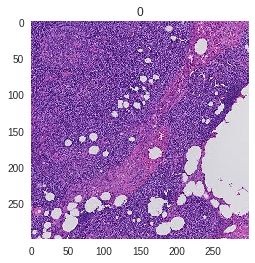

In [25]:
print(X_train.shape, X_val.shape, X_test.shape)
print('# train: %d, # val: %d, # test: %d' % (len(y_train), len(y_val), len(y_test)))
print('affected patches in train: %d, val: %d, test: %d ' % (sum(y_train), sum(y_val), sum(y_test)))

plt.imshow(X_train[100])
plt.title(y_train[100])
plt.gca().grid(False)
plt.show()

In [0]:
# make data generators

def rescale11(x):
    """Rescale RBG values to [-1, 1]
    """
    
    x = x.astype(float)
    x /= 255.
    x -= 0.5
    x *= 2.
    return x
  
def rescale01(x):
    """Rescale RBG values to [0, 1]
    """
    
    x = x.astype(float)
    x /= 255.
    return x
  
if my_pre_process == 'rescale_0-1':
  preprocess_input = rescale01
if my_pre_process == 'rescale_-1-1':
  preprocess_input = rescale11
  
# define datagens
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=preprocess_input)
val_datagen = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=preprocess_input)
test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=preprocess_input)

# make datagens for train, val, test
train_generator = train_datagen.flow(X_train, y_train, batch_size=32, shuffle=True)
val_generator = train_datagen.flow(X_val, y_val, batch_size=32, shuffle=True)
test_generator = train_datagen.flow(X_test, y_test, batch_size=32, shuffle=True)

# Model definition

## Inception V3 convolutional base

In [0]:
if my_conv_base == 'Inception':
  conv_base_incept = tf.keras.applications.inception_v3.InceptionV3(weights='imagenet',
                                          include_top=False,
                                          input_shape=(patch_size, patch_size, 3))

  # fully connected top layers
  model = tf.keras.Sequential([
          conv_base_incept,
          tf.keras.layers.Flatten(),
          tf.keras.layers.Dense(256, activation='relu'),
          tf.keras.layers.Dropout(.5),
          tf.keras.layers.Dense(1, activation='sigmoid')
          ])
  
  print('Number of trainable layers:', len(model.trainable_weights))
  
  model.summary()

## Concolutional base defined by me

In [28]:
if my_conv_base == 'my-conv-base':

  model = tf.keras.Sequential([

      tf.keras.layers.Conv2D(32, kernel_size=(5, 5), input_shape=(patch_size, patch_size, 3), padding='same'),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.Activation('relu'),
      
      tf.keras.layers.Conv2D(32, kernel_size=(3, 3), padding='same'),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.Activation('relu'),

      tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),

      
      tf.keras.layers.Conv2D(64, kernel_size=(3, 3), padding='same'),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.Activation('relu'),

      tf.keras.layers.Conv2D(64, kernel_size=(3, 3), padding='same'),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.Activation('relu'),

      tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),


      tf.keras.layers.Conv2D(64, kernel_size=(3, 3), padding='same'),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.Activation('relu'),
      
      tf.keras.layers.Conv2D(64, kernel_size=(3, 3), padding='same'),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.Activation('relu'),

      tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),


      tf.keras.layers.Conv2D(128, kernel_size=(3, 3), padding='same'),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.Activation('relu'),
      
      tf.keras.layers.Conv2D(128, kernel_size=(3, 3), padding='same'),
      tf.keras.layers.BatchNormalization(),
      tf.keras.layers.Activation('relu'),

      tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),

      # fully connected top layers
      tf.keras.layers.Flatten(),
      tf.keras.layers.Dense(256, activation='relu'),
      tf.keras.layers.Dropout(.5),
      tf.keras.layers.Dense(1, activation='sigmoid')    
  ])
  
  model.summary()
  
  print('Number of trainable layers:', len(model.trainable_weights))

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 299, 299, 32)      2432      
_________________________________________________________________
batch_normalization (BatchNo (None, 299, 299, 32)      128       
_________________________________________________________________
activation (Activation)      (None, 299, 299, 32)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 299, 299, 32)      9248      
_________________________________________________________________
batch_normalization_1 (Batch (None, 299, 299, 32)      128       
_________________________________________________________________
activation_1 (Activation)    (None, 299, 299, 32)      0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 149, 149, 32)      0         
__________

# Model execution

In [0]:
# compile model

model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=2e-5),
                     loss='binary_crossentropy',
                     metrics=['accuracy'])

In [30]:
# use early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_acc',
                                                  min_delta=0.001,
                                                  patience=3,
                                                  verbose=1)

# time model run
start_time = time.time()/60
history = model.fit_generator(
    train_generator,
    steps_per_epoch=32*9,
    epochs=50,
    validation_data=val_generator,
    validation_steps=50,
    callbacks=[early_stopping])
train_time = time.time()/60 - start_time
print('Time: %.2f min' % train_time)


# save model to Colab
model_filename = model_name + '_MODEL.h5' 
model.save(model_filename)

# check if model is there
!ls -hlt *.h5


# upload model to Google Drive

# authenticate and create the PyDrive client
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

uploaded = drive.CreateFile({'title': model_filename})
uploaded.SetContentFile(model_filename)
uploaded.Upload()
print('Uploaded file %s with ID %s' % (model_filename, uploaded.get('id')))

Epoch 1/50
288/288 [==============================] - 202s 701ms/step - loss: 0.4545 - acc: 0.8164 - val_loss: 1.3608 - val_acc: 0.2852
Epoch 2/50
288/288 [==============================] - 192s 666ms/step - loss: 0.1755 - acc: 0.9322 - val_loss: 1.3420 - val_acc: 0.6922
Epoch 3/50
288/288 [==============================] - 192s 666ms/step - loss: 0.0949 - acc: 0.9656 - val_loss: 0.4633 - val_acc: 0.8956
Epoch 4/50
288/288 [==============================] - 192s 666ms/step - loss: 0.0517 - acc: 0.9797 - val_loss: 0.1440 - val_acc: 0.9661
Epoch 5/50
288/288 [==============================] - 192s 666ms/step - loss: 0.0430 - acc: 0.9852 - val_loss: 0.1435 - val_acc: 0.9661
Epoch 6/50
288/288 [==============================] - 192s 666ms/step - loss: 0.0258 - acc: 0.9907 - val_loss: 0.1799 - val_acc: 0.9701
Epoch 7/50
288/288 [==============================] - 192s 666ms/step - loss: 0.0256 - acc: 0.9922 - val_loss: 0.0747 - val_acc: 0.9781
Epoch 8/50
288/288 [============================

In [0]:
def plot_history(histories, key=['acc', 'loss']):
    """ plot model training history
    """
    
    fig, axes = plt.subplots(1,2, figsize=(15, 5))
    
    for i, ax_key in enumerate(key): 
        ax = axes[i]
        ax_key = key[i]
        
        for name, history in histories:
            
            val = ax.plot(history.epoch, history.history['val_'+ax_key], '--', label=name.title()+' Val')
            ax.plot(history.epoch, history.history[ax_key], color=val[0].get_color(), label=name.title()+' Train')

        ax.set_xlabel('Epochs')
        ax.set_ylabel(ax_key.replace('_',' ').title())
        
        if ax_key=='acc':
            ax.legend()
        else: 
            ax.legend(loc=1)
            
    plt.title('Training time: %.2f min' % train_time)
        
    plt.show()
    
    fig.savefig(model_name+'_training-history.pdf', bbox_inches='tight')

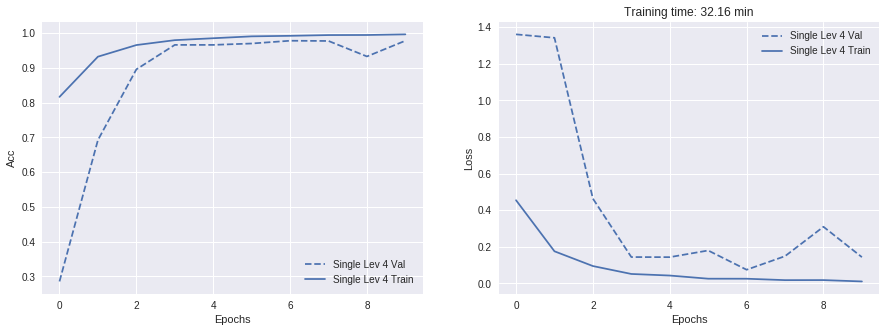

In [32]:
plot_history([('single lev ' + str(lev), history)])

In [0]:
# load model if it's already saved on Colab

# model_filename = model_name + '_MODEL.h5' 
# model = load_model(model_filename)

In [0]:
# delete unnecessary variables to save memory
del X_train, X_val, y_train, y_val

# Model evaluation

on a test set from unseen slides

In [35]:
# accuracy on the test set (balanced)

test_loss, test_acc = model.evaluate_generator(test_generator, steps=50)
print('Test loss: %.3f, accuracy: %.3f' % (test_loss, test_acc))

Test loss: 0.064, accuracy: 0.976


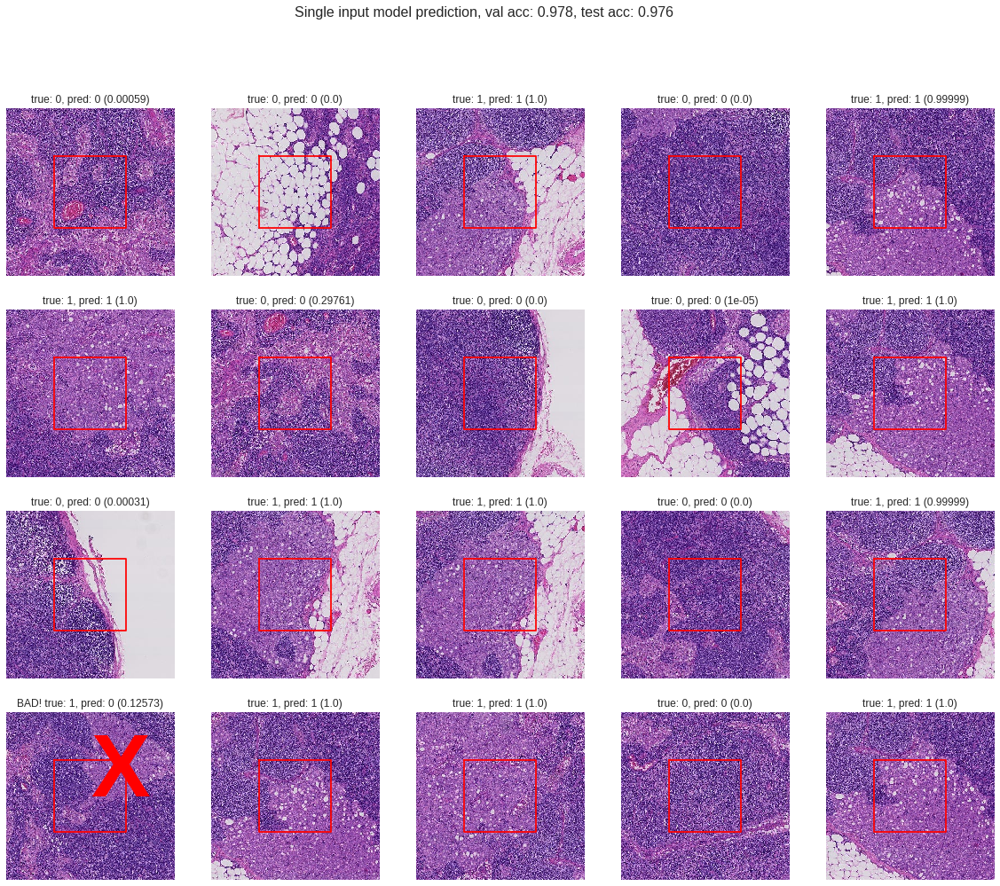

In [36]:
# visually check some predictions for examples from the test set (slides unseen in training)

# get a batch from test datagen
vis_examples = next(test_generator)

# extract images and labels for that batch
vis_img = vis_examples[0]
vis_lab = vis_examples[1]

# make a prediction for that batch
vis_pred = model.predict(vis_img)

offset = int((patch_size-patch_centre)/2)

bad_font = {'weight' : 'bold', 
            'size'   : 100}

# plot n examples
n = 20
fig, axes = plt.subplots(4,5, figsize=(20, 16))
axes = axes.ravel()

for i in range(n):
    a = axes[i]
        
    # convert the array to image format
    img = array_to_img(vis_img[i].reshape(patch_size,patch_size,3))
    a.imshow(img)
    
    # plot the 128x128 central square
    a.plot([offset, offset+patch_centre, offset+patch_centre, offset, offset],
           [offset, offset, offset+patch_centre, offset+patch_centre, offset], 'r')
    
    # remove tick labels
    a.set_xticks([]), a.set_yticks([])
    a.set_yticklabels([]), a.set_xticklabels([])
    
    # get ith predicted class
    pred_prob = vis_pred[i][0]
    pred_class = int(pred_prob>=0.5)
    
    # put details in titles
    # put a big red 'X' on misclassified images
    if vis_lab[i]==pred_class:
        a.set_title('true: '+ str(vis_lab[i])+', pred: '+str(pred_class) + ' (' + str(round(pred_prob,5)) + ')')
    else:
        a.set_title('BAD! true: '+ str(vis_lab[i])+', pred: '+str(pred_class) + ' (' + str(round(pred_prob,5)) + ')')
        a.text(150, 150, 'X', color='r', **bad_font)
        
fig.suptitle('Single input model prediction, val acc: %.3f, test acc: %.3f' % (history.history['val_acc'][-1], test_acc), fontsize=16)   

plt.show()

fig.savefig(model_name+'_pred_test_mosaic.pdf', bbox_inches='tight')

# Heatmap generation


In [0]:
# delete unnecessary variables to save memory
del X_test, y_test

In [0]:
def get_patches_predict(slide, tumor_mask, lev, x0, y0, patch_size):
    """ Get patches from a slide: RBG image, tumor mask CENTERED at x0, y0
    imputs:
    - slide: OpenSlide object for RGB slide images
    - tumor_mask: OpenSlide object for tumor masks
    - lev: int, target zoom level for the patches, between 0 and 7
    - x0, y0: int, pixel coordinates at level 0
    - patch_size: int, usually 299
    outputs:
    - patch_image: array, RBG image
    - patch_mask: array, tumor mask
    """
    
    # calc downsample factor
    downsample_factor = 2**lev
    
    # read RGB patch
    patch_image = read_slide(slide,
                             x = x0-(patch_size//2)*downsample_factor,
                             y = y0-(patch_size//2)*downsample_factor, 
                             level = lev,
                             width = patch_size,
                             height = patch_size)
    
    # read tumor mask
    patch_mask = read_slide(tumor_mask,
                            x = x0-(patch_size//2)*downsample_factor,
                            y = y0-(patch_size//2)*downsample_factor, 
                            level = lev,
                            width = patch_size,
                            height = patch_size)
    
    # 1 channel is enough for the mask
    patch_mask = patch_mask[:,:,0]
    
    return patch_image, patch_mask

In [0]:
def get_heatmap(f_num, lev, patch_size, patch_centre):
  """ Generate a heatmap at level 7 by sliding a window in x and y in and extracting 
  patches at the model zoom level for every pixel at level 7
  
  inputs:
  - f_num: str, slide number
  - lev: int, target zoom level for the patches, between 0 and 7
  - patch_size: int, usually 299
  - patch_centre: int, usually 128
  
  outputs:
  - heatmap: array of floats, heatmap at level 7
  - max_heatmap: maximum of the heatmap
  outputs: evaluation scores for imbalanced classification (from sklearn.metric):
  - precision: float in [0, 1]
  - recall: float in [0, 1]
  - f1: float in [0, 1]
  - roc_auc: float in [0, 1]
  - avg_prec: float in [0, 1]
  - save a plot of the heatmap
  """
  
  # ---------------------------------------------------------------------------
  # get the slide at level 7 and plot it
  
  # file paths
  slide_path = '/root/slides/tumor_'+f_num+'.tif'
  tumor_mask_path = '/root/slides/tumor_'+f_num+'_mask.tif'

  print(slide_path, tumor_mask_path)

  # get slide objects with OpenSlide
  slide = open_slide(slide_path)
  tumor_mask = open_slide(tumor_mask_path)

  # read level 7 RBG image
  slide_image_lev7 = read_slide(slide, 
                           x=0, 
                           y=0, 
                           level=7, 
                           width=slide.level_dimensions[7][0], 
                           height=slide.level_dimensions[7][1])
  
  # read level 7 tumor mask
  mask_image_lev7 = read_slide(tumor_mask, 
                          x=0, 
                          y=0, 
                          level=7, 
                          width=tumor_mask.level_dimensions[7][0], 
                          height=tumor_mask.level_dimensions[7][1])

  mask_image_lev7 = mask_image_lev7[:,:,0]

  # get tissue mask
  tissue_pixels_lev7 = find_tissue_pixels(slide_image_lev7)
  tissue_regions_lev7 = apply_mask(slide_image_lev7, tissue_pixels_lev7)

  # plot images and masks
  fig, axes = plt.subplots(1,3, figsize=(20,10), dpi=100)
  axes[0].imshow(slide_image_lev7)
  axes[1].imshow(mask_image_lev7)
  axes[2].imshow(tissue_regions_lev7)
  plt.show()
  
  # ---------------------------------------------------------------------------
  # slide through the image and fill in the heatmap

  start_time = time.time()/60
  
  # init the heatmap with zeros (size of level 7)
  heatmap = np.zeros(slide_image_lev7.shape[:2])

  true_class, pred_class = [], []

  # stride at level 7
  stride = 2**lev

  # offset for correctly setting the values in heatmap
  heatmap_offset = stride//2

  
  heat_x = []
  heat_y = []

  # collect a batch of 1000 patches and make a prediction on that batch (done to speed up)
  strip_of_patches = []

  print(slide.level_dimensions[7][0], slide.level_dimensions[7][1])

  # slide in x by stride 
  for x in range(stride*2, slide.level_dimensions[7][1]-3*stride, stride):

    if x%(10*stride)==0:
      print('|', x, end=': ')
      if x%(10*10*stride)==0:
        print()

    # slide in y by stride 
    for y in range(stride*2, slide.level_dimensions[7][0]-3*stride, stride):

      # convert level 7 coordinates to level 0
      x0 = x*(2**7)
      y0 = y*(2**7)

      # only do prediction if the pixel at level 7 is a tissie (i.e. >0.8 greyscale)
      if tissue_regions_lev7[x, y, 0]==1:

        # keep level 7 coordinates
        heat_x.append(x)
        heat_y.append(y)

        # get patch CENTERED at x0, y0
        patch_image, patch_mask = get_patches_predict(slide, tumor_mask, lev, y0, x0, patch_size)
        # append to the batch of patches
        strip_of_patches.append(patch_image)

        # get true label
        has_cancer = check_patch_centre(patch_mask, patch_centre)
        true_class.append(has_cancer)
        
        # if 1000 patches collected, make a prediction for them and append the precictions
        if len(strip_of_patches)==1000:
          X = np.asarray(strip_of_patches)
          print(X.shape[0], end=' ')
          my_pred = model.predict(preprocess_input(X))
          
          pred_class.extend(my_pred)

          # reset strip of patches
          strip_of_patches = []

  # make a prediction for remaining patches (last strip with num patches <1000)
  X = np.asarray(strip_of_patches)
  print(X.shape[0], end=' ')
  my_pred = model.predict(preprocess_input(X))

  pred_class.extend(my_pred)
  
  
  # fill in the patch in heatmap with predicted values
  # use saved level 7 x and y coordinates and saved predictions
  if lev==0:
    # if model level was 0 - fill only one pixel in the heatmap
    for i in range(len(pred_class)):
      heatmap[heat_x[i], heat_y[i]] = pred_class[i]
  else:
    # if mode level > 0 - fill an appropriate patch
    for i in range(len(pred_class)):
      heatmap[heat_x[i]-heatmap_offset:heat_x[i]+heatmap_offset, heat_y[i]-heatmap_offset:heat_y[i]+heatmap_offset] = pred_class[i]
      
  heat_time = time.time()/60 - start_time
  
  # ---------------------------------------------------------------------------
  # print evaluation metrics

  # get max of heatmap to report
  max_heatmap = np.max(heatmap)

  print()
  print('Heatmap max: %.3f' % max_heatmap)
  print()

  # calc roc auc score and average precision on predicted probabilities (float in [0, 1])
  roc_auc = roc_auc_score(np.array(true_class) == 1, pred_class)
  avg_prec = average_precision_score(np.array(true_class) == 1, pred_class)
  
  # calc other scores on the predicted labels (0 or 1)
  precision = precision_score(np.array(true_class) == 1, np.array(pred_class) >= 0.5)
  recall = recall_score(np.array(true_class) == 1, np.array(pred_class) >= 0.5)
  f1 = f1_score(np.array(true_class) == 1, np.array(pred_class) >= 0.5)

  print('Precision score: %.3f' % precision)
  print('Recall score: %.3f' % recall)
  print('F1 score: %.3f' % f1)
  print('ROC AUC score: %.3f' % roc_auc)
  print('Average precision score: %.3f' % avg_prec)
  
  
  # ---------------------------------------------------------------------------
  # plot figure with heatmap overlay

  fig, axes = plt.subplots(1,2, figsize=(20,20), dpi=100)
  
  cmap = plt.cm.viridis

  # normalize the mask between 0 and 1
  v_min, v_max = 0, 1
  colors = Normalize(v_min, v_max)(mask_image_lev7)
  colors = cmap(colors)
  # add transparency layer equal to the image: low values are translarent,
  # high values are more opaque
  colors[..., -1] = mask_image_lev7/np.max(mask_image_lev7)

  # image in RGB with tumor mask overlay (viridis) - cancer is yellow
  a = axes[0]
  a.imshow(slide_image_lev7)
  a.imshow(colors, cmap='viridis', vmin=v_min, vmax=v_max, alpha=0.8)
  a.set_xticks([]), axes[0].set_yticks([])
  a.set_title('TRUE (tumor as labeled by a pathologist), slide num: ' + f_num)

  
  a = axes[1]
  
  v_min, v_max = 0, 1
  colors = Normalize(v_min, v_max)(heatmap)
  colors = cmap(colors)
  # add transparency layer equal to the image: low values are translarent,
  # high values are more opaque
  colors[..., -1] = heatmap/np.max(heatmap)

  # image in RGB with HEATMAP overlay (viridis) - cancer is yellow
  a.imshow(slide_image_lev7)
  a.imshow(colors, cmap='viridis', vmin=v_min, vmax=v_max, alpha=0.8)
  a.set_xticks([]), axes[1].set_yticks([])
  a.set_title('PRED (single model lev %d), slide num: %s | max: %.2f,  prec: %.2f, rec: %.2f, f1: %.2f, , roc auc: %.2f, avg prec: %.2f, time: %.2f' %
              (lev, f_num, max_heatmap,  precision, recall, f1, roc_auc, avg_prec, heat_time))

  plt.show()

  fig.savefig(model_name+'_pred_'+f_num+'.pdf', bbox_inches='tight')
  
  return heatmap, max_heatmap, precision, recall, f1, roc_auc, avg_prec

/root/slides/tumor_091.tif /root/slides/tumor_091_mask.tif


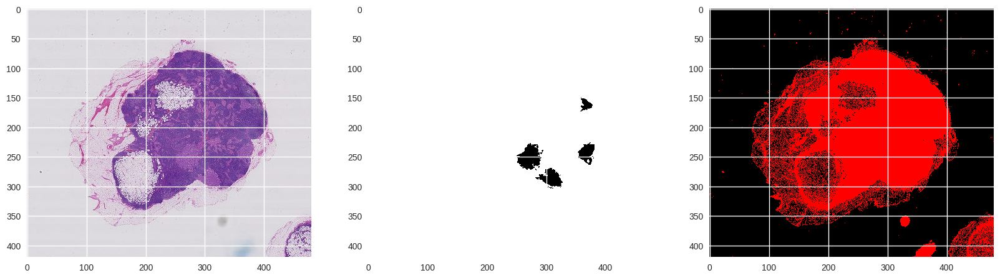

480 420
| 160: | 320: 226 
Heatmap max: 1.000

Precision score: 0.613
Recall score: 0.613
F1 score: 0.613
ROC AUC score: 0.896
Average precision score: 0.711


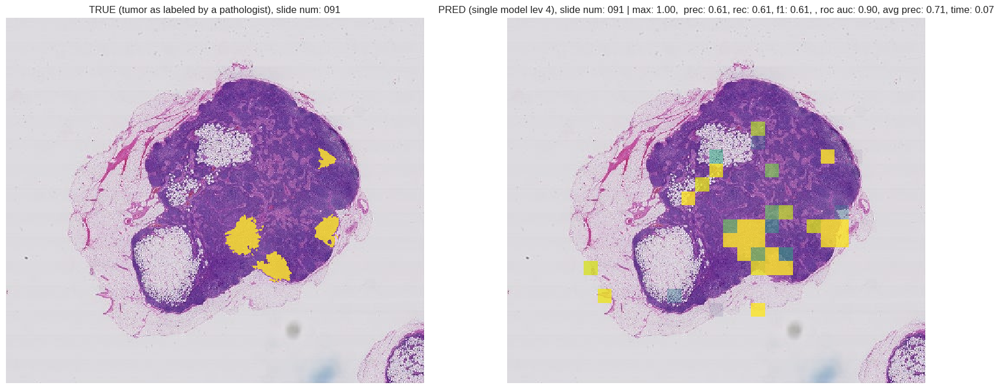

/root/slides/tumor_110.tif /root/slides/tumor_110_mask.tif


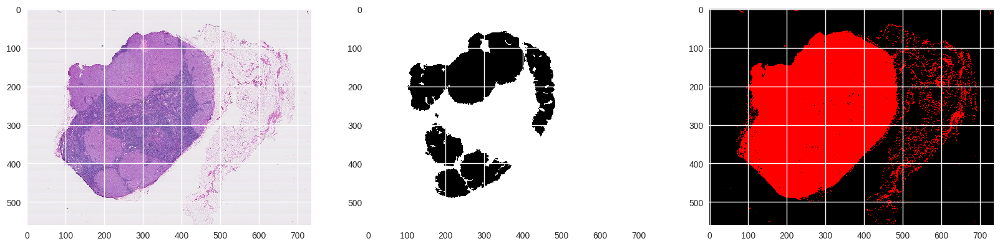

736 560
| 160: | 320: | 480: 540 
Heatmap max: 1.000

Precision score: 0.969
Recall score: 0.951
F1 score: 0.960
ROC AUC score: 0.992
Average precision score: 0.995


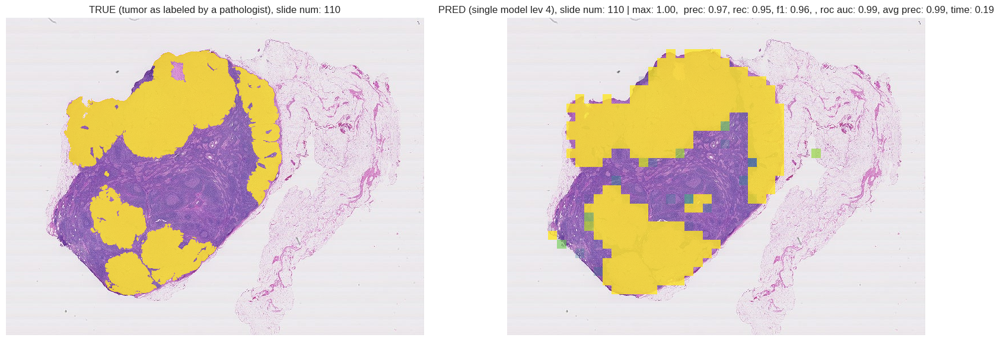

/root/slides/tumor_031.tif /root/slides/tumor_031_mask.tif


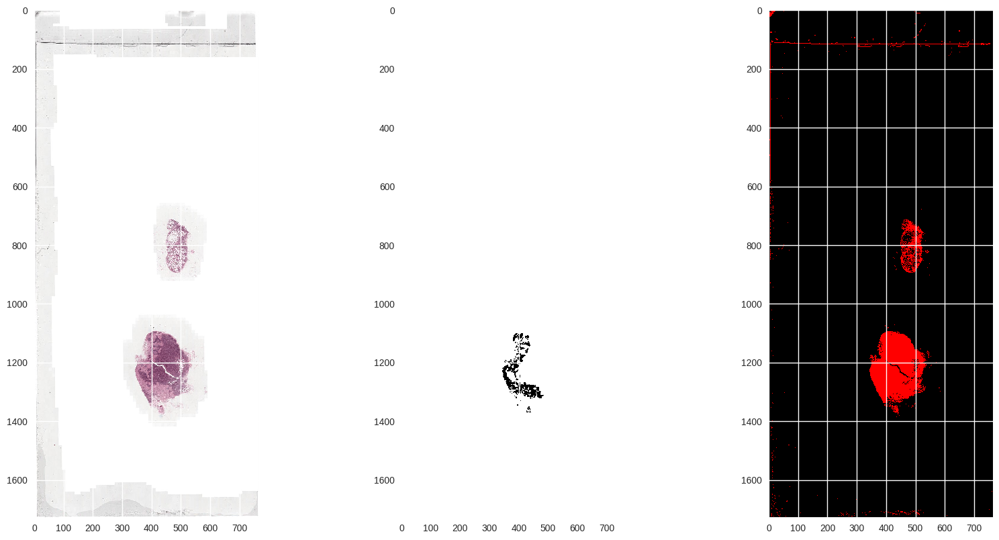

764 1728
| 160: | 320: | 480: | 640: | 800: | 960: | 1120: | 1280: | 1440: | 1600: 
162 
Heatmap max: 1.000

Precision score: 0.912
Recall score: 0.899
F1 score: 0.905
ROC AUC score: 0.976
Average precision score: 0.973


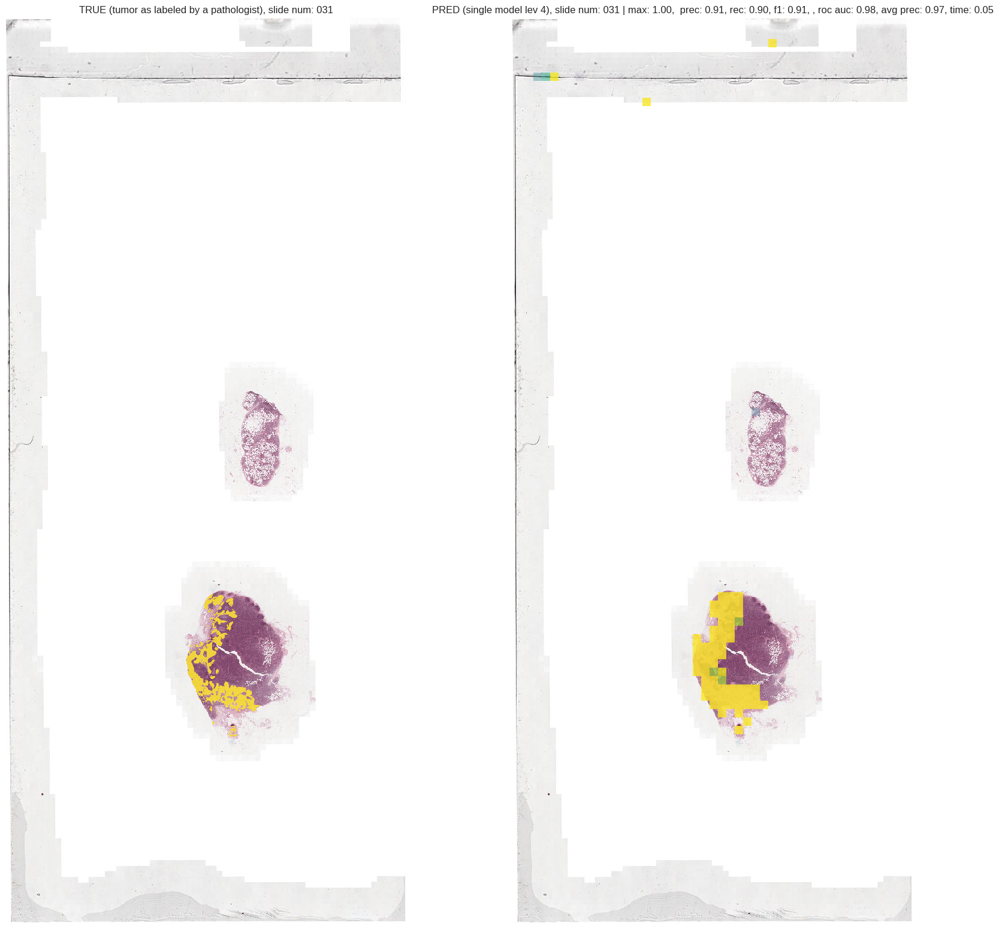

In [40]:
# train/val set: ['016', '031', '064', '075', 078', '084', 094', '096', '101']:
# test slide: '091'
# slide not exhaustively annotated: '110'

# generate a heatmap for:
# '091' - test slide
# '110' - non-exhaustively annotated slide
# '031' - slide from the training set

slides_to_heatmap = ['091', '110', '031']

for f_num in slides_to_heatmap:
  heatmap, max_heatmap, precision, recall, f1, roc_auc, avg_prec = get_heatmap(f_num, lev, patch_size, patch_centre)

In [41]:
# save prediction and heatmep pdfs to Google Drive

# authenticate and create the PyDrive client
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

for f in glob.glob('*.pdf'):
  uploaded = drive.CreateFile({'title': f})
  uploaded.SetContentFile(f)
  uploaded.Upload()
  print('Uploaded file %s with ID %s' % (f, uploaded.get('id')))

Uploaded file single-input_my-conv-base_rescale_0-1_lev4_patches_078_cancer-False.pdf with ID 1P6NhZaeoKojhIFWh6OZ9Yj9S12DesI8Y
Uploaded file single-input_my-conv-base_rescale_0-1_lev4_patches_096_cancer-False.pdf with ID 1d_iUneADwdE9bhO5TDkTkUD0Zv7Okg7c
Uploaded file single-input_my-conv-base_rescale_0-1_lev4_patches_064_cancer-True.pdf with ID 1lgm5rnYyrvVi6jLNQL85qoXwCiWmVq6W
Uploaded file single-input_my-conv-base_rescale_0-1_lev4_patches_096_cancer-True.pdf with ID 1xmMz8ciN2MWwUdBcVF1kK1N79_gYV_Np
Uploaded file single-input_my-conv-base_rescale_0-1_lev4_patches_064_cancer-False.pdf with ID 1Z9N1JnqhE12MTSDPJ9qBwRQIro8C4QWu
Uploaded file single-input_my-conv-base_rescale_0-1_lev4_patches_091_cancer-True.pdf with ID 1g4SQH6hap5RrNYhPLRSyDHvLrVGZ1qKy
Uploaded file single-input_my-conv-base_rescale_0-1_lev4_pred_031.pdf with ID 1p_WSCHcF-xjFDhW6g0R2eAbD0pWpp7FO
Uploaded file single-input_my-conv-base_rescale_0-1_lev4_patches_031_cancer-True.pdf with ID 1thoIc1xufmjEFQBJzzRYAWvf_XC2T